# Analysis of zeb BP2-CaM compact
## Comparison of all CaM states

In [1]:
import sys
import os
import pandas as pd
import numpy as np

# Add the lda directory to Python path
lda_path = os.path.join(os.getcwd(), 'lda')
if lda_path not in sys.path:
    sys.path.append(lda_path)

# Import the interactive pipeline functions
from pipeline_helper import run_interactive_pipeline, create_interactive_pipeline_configs, summarize_and_evaluate

# Import your existing data access module
from data_access import create_dataframe_factory, list_available_constructs_subconstructs

print("✅ Imports completed successfully!")

✅ Imports completed successfully!


In [2]:
data_dir = '/work/hdd/bfri/jjeong7/analysis_output/dist_maps'
constructs_dict, subconstructs_dict = list_available_constructs_subconstructs(base_dir=data_dir)

# Specific states of specific proteins
data_factory = create_dataframe_factory(
    base_dir=data_dir, 
    constructs=['calmodulin-compact'],
    apply_boundary_filter=True, # 🛠️ ACTIVATE TRANSFORMATION
    n_edge=3,
    min_frame=0,
)

In [3]:
# Create all possible pipeline combinations
configs = create_interactive_pipeline_configs()

🚀 Starting Interactive Pipeline Runner
💡 Variance runs first, then feature selection, then dimensionality reduction
⚙️  You'll set parameters for each phase

PHASE 1: VARIANCE


Found cached result for VARIANCE (pipeline_cache/variance.pkl). Load? (Y/n):  y


Loaded cached VARIANCE data.
Shape: (90000, 426)
Variance Output: (90000, 426)

CLASS ASSIGNMENT
Choose class assignment method:
1. Default: construct + subconstruct
2. GMM: Gaussian Mixture Model (shared states)
3. Spectral: Non-linear spectral clustering
4. TICA: Kinetic landscape state assignment


Enter choice (1-4):  2



[CLUSTERING : GMM]
📋 Parameter Controls:
  🎯 Method: Gaussian Mixture Model (with BIC visualization)
⚙️  Hyperparameters:
  stride: 10 - Data sampling stride - higher = faster but less precise
  max_k: 15 - Maximum clusters to test - higher = more options
  S: 1.0 - Knee sensitivity - higher = more clusters, lower = fewer
  show_plots: True - Show BIC diagnostics plot



Modify? (y/N):  n


Sampling dataset (stride=10) to find optimal GMM components...
✅ BIC analysis complete. Optimal K (S=1.0): 6


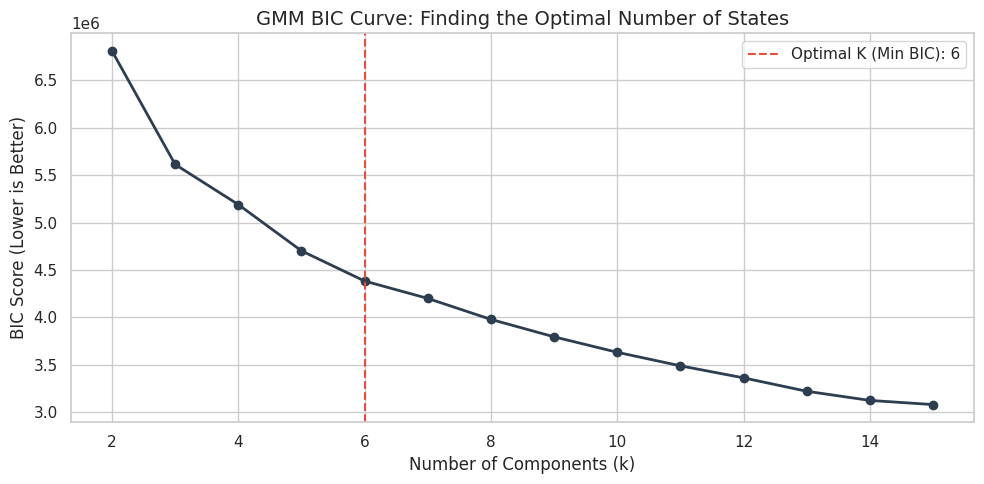

Fitting final GMM with 6 components...
Assigning GMM state labels to the full dataset...
Assigned 6 GMM-based classes

--- Cluster Composition (%) ---
col_0              calmodulin-compact | ca-mg-1-2  \
global_cluster_id                                   
0                                            6.24   
1                                           30.27   
2                                           35.91   
3                                           29.29   
4                                           15.56   
5                                           23.71   

col_0              calmodulin-compact | ca-mg-1-4  \
global_cluster_id                                   
0                                           44.61   
1                                           20.04   
2                                           24.79   
3                                           27.51   
4                                           35.85   
5                                           13.33   


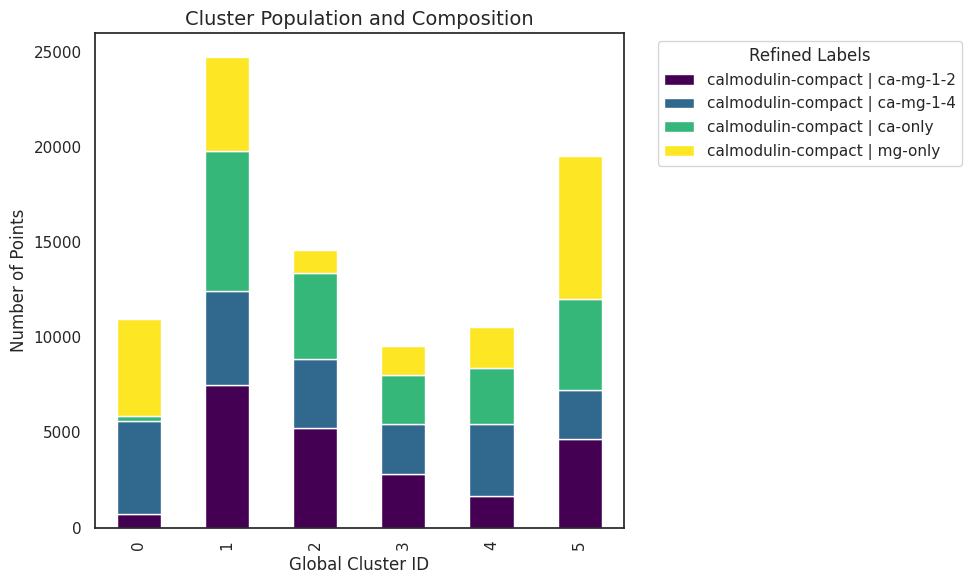

Found cached result for FISHER_AMINO (pipeline_cache/fisher_amino.pkl). Load? (Y/n):  n



[FEATURE_SELECTION : FISHER_AMINO]
📋 Parameter Controls:
  🔬 Method: Fisher scoring with AMINO dimensionality reduction
⚙️  Hyperparameters:
  max_outputs: None - Target features (None = Dynamic selection via AMINO Distortion Jump method)
  knee_S: 2.0 - Sensitivity for the initial Fisher candidate knee - higher = more features



Modify? (y/N):  n


Running FISHER_AMINO...
Successfully imported Optimized AMINO (Parallel)
Calculating Fisher scores sequentially...
Found classes: ['cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5']
Loading 31 candidate features into memory...
Running AMINO on 31 candidates...
AMINO: Dynamic feature selection enabled. Searching up to 40 clusters...
Selected bandwidth: 0.3286363480808588

Calculating all pairwise distances...
[########################################] | 100% Completed | 32.70 s
📊 Generating AMINO diagnostic plots...


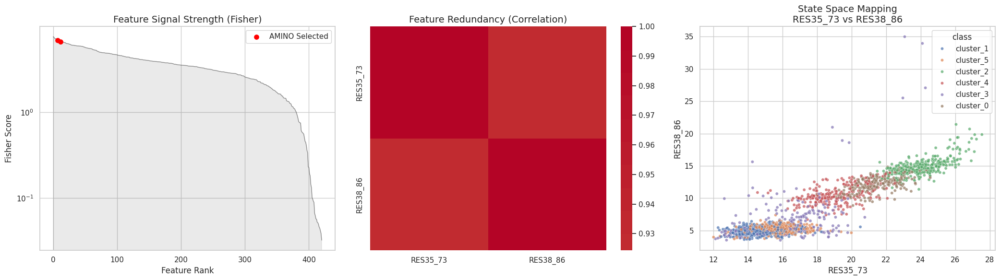

FISHER_AMINO Result Shape: (90000, 8)



Accept FISHER_AMINO results? (y/N):  y


Results accepted and cached to pipeline_cache/fisher_amino.pkl


Found cached result for BPSO (pipeline_cache/bpso.pkl). Load? (Y/n):  n



[FEATURE_SELECTION : BPSO]
📋 Parameter Controls:
  🔬 Method: Binary PSO - swarm intelligence for feature selection
⚙️  Hyperparameters:
  candidate_limit: None - Max features for optimization (None = Dynamic selection via Fisher Score Knee)
  knee_S: 2.0 - Sensitivity for the candidate filtering knee - higher = more features
  population_size: 20 - Swarm size - more particles = better exploration
  max_iter: 30 - Max iterations - higher = more optimization
  w: 0.729 - Inertia weight - controls exploration vs exploitation
  c1: 1.49445 - Cognitive parameter - individual learning influence
  c2: 1.49445 - Social parameter - swarm influence
  stride: 10 - Data sampling stride - higher = less data



Modify? (y/N):  n


Running BPSO...
Pass 1: Filtering features via Streaming Fisher Score (stride=10)...
Dynamic candidate selection: Fisher score knee at index 29 (30 features)
Pass 2: Loading 30 features (stride=10)...
Beginning Swarm Optimization on 9000 samples...
.........  > Evaluations completed: 50...
.........  > Evaluations completed: 100...
.........  > Evaluations completed: 150...
.........  > Evaluations completed: 200...
.........  > Evaluations completed: 250...
.........  > Evaluations completed: 300...
.........  > Evaluations completed: 350...
.........  > Evaluations completed: 400...
.........  > Evaluations completed: 450...
.........  > Evaluations completed: 500...
.........  > Evaluations completed: 550...
.........  > Evaluations completed: 600...
....
✅ Final selection: 11 features.


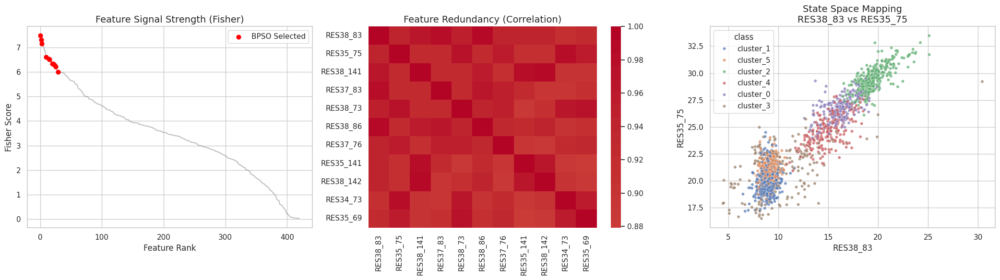

Pass 3: Recovering all rows for 11 features...
BPSO Result Shape: (90000, 17)



Accept BPSO results? (y/N):  y


Results accepted and cached to pipeline_cache/bpso.pkl


Found cached result for CHI_SQ_AMINO (pipeline_cache/chi_sq_amino.pkl). Load? (Y/n):  n



[FEATURE_SELECTION : CHI_SQ_AMINO]
📋 Parameter Controls:
  🔬 Method: Chi-square selection with AMINO reduction
⚙️  Hyperparameters:
  stride: 25 - Data sampling stride - higher = less memory usage
  max_amino: None - Target features (None = Dynamic selection via AMINO Distortion Jump method)
  q_bins: 5 - Quantile bins for chi-square - higher = more resolution
  sample_rows: 20000 - Sample size for binning - higher = more accurate bins
  knee_S: 5.0 - Sensitivity for the initial Chi-Square candidate knee - higher = more features



Modify? (y/N):  n


Running CHI_SQ_AMINO...
Successfully imported Optimized AMINO (Parallel)
Sampling to estimate Chi-Squared bin edges and classes...
Building Chi-Squared scores sequentially (stride=25)...
Knee Point: 5272.9106 | Candidates: 27
Loading 27 features (stride=25)...
Running AMINO on 27 candidates...
AMINO: Dynamic feature selection enabled. Searching up to 40 clusters...
Selected bandwidth: 0.561960250421939

Calculating all pairwise distances...
[########################################] | 100% Completed | 13.93 s
✅ Selected 2 final features.
📊 Generating AMINO diagnostic plots...


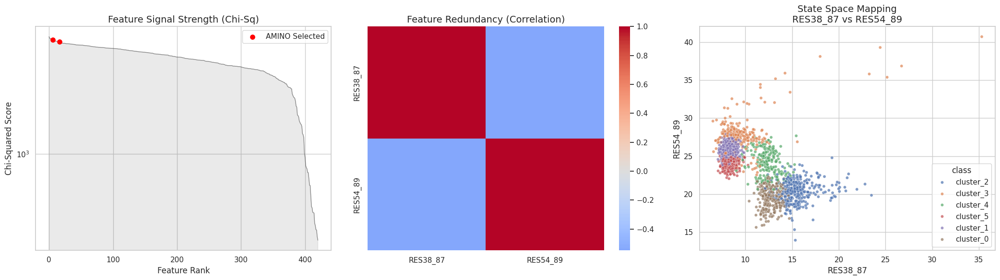

Pass 3: Extracting all rows for the 2 selected features...
Loading 2 features (stride=1)...
CHI_SQ_AMINO Result Shape: (90000, 6)



Accept CHI_SQ_AMINO results? (y/N):  y


Results accepted and cached to pipeline_cache/chi_sq_amino.pkl


Found cached result for MPSO (pipeline_cache/mpso.pkl). Load? (Y/n):  n



[FEATURE_SELECTION : MPSO]
📋 Parameter Controls:
  🔬 Method: Multi-objective PSO - balances accuracy vs sparsity
⚙️  Hyperparameters:
  dims: None - Output dimensions (None = default 5)
  candidate_limit: None - Max features for optimization (None = Dynamic selection via Fisher Score Knee)
  knee_S: 2.0 - Sensitivity for the candidate filtering knee - higher = more features
  max_iter: 10 - PSO iterations - higher = better optimization
  population_size: 40 - Swarm population size - larger = better search
  alpha: 0.9 - Accuracy-sparsity tradeoff - 0.0=accuracy, 1.0=sparsity
  threshold: 0.5 - Feature selection threshold - higher = fewer features
  redundancy_weight: 0.2 - Dimension independence penalty (0.0=none, 1.0=max redundancy reduction)
  stride: 15 - Data sampling stride - higher = less data



Modify? (y/N):  n


Running MPSO...
Pass 1: Computing Fisher scores (stride=15)...
Dynamic candidate selection: Fisher score knee at index 29 (30 features)
MPSO: Output dimensions set to default (dims=5)
Pass 2: Loading search data (stride=15)...
Beginning Swarm Optimization on 6000 samples...
.........  > Evaluations completed: 50...
.........  > Evaluations completed: 100...
.........  > Evaluations completed: 150...
.........  > Evaluations completed: 200...
.........  > Evaluations completed: 250...
.........  > Evaluations completed: 300...
.........  > Evaluations completed: 350...
.........  > Evaluations completed: 400...
........
✅ Optimization complete.
Pass 3: Recovering all rows and applying projection...
📊 Generating MPSO diagnostic plots...
Visualization failed: Data must be 1-dimensional, got ndarray of shape (2000, 2) instead
MPSO Result Shape: (90000, 11)



Accept MPSO results? (y/N):  y


Results accepted and cached to pipeline_cache/mpso.pkl

🤖 AUTOMATED DIMENSIONALITY REDUCTION PHASE


Found existing DR caches. Recompute ALL methods? (y/N):  y


No further interaction required. Results will be saved automatically.
🚀 Processing: BPSO ➔ FLDA
Performing SVD on 11 features...
Dynamic dimensionality selection: 1 components capture 95% scatter variance
Selected features (11): ['RES38_83', 'RES35_75', 'RES38_141', 'RES37_83', 'RES38_73', 'RES38_86', 'RES37_76', 'RES35_141', 'RES38_142', 'RES34_73']...
Result: SUCCESS (Saved to bpso_to_flda.pkl)
🚀 Processing: BPSO ➔ PCA
Dynamic dimensionality selection: target = 95% variance
Shape before PCA:  (90000, 11)
Shape after PCA: (90000, 2) (Captured 96.52% variance)
Variances: [153.09830889   3.85530495]
Variance ratios: [0.94151895 0.02370923]
Selected features (11): ['RES38_83', 'RES35_75', 'RES38_141', 'RES37_83', 'RES38_73', 'RES38_86', 'RES37_76', 'RES35_141', 'RES38_142', 'RES34_73']...
Result: SUCCESS (Saved to bpso_to_pca.pkl)
🚀 Processing: BPSO ➔ ZHLDA
ZHLDA Dynamic selection: 2 components capture 95% generalized scatter
ZHLDA: Optimizing 11 features...
Selected features (11): ['RES

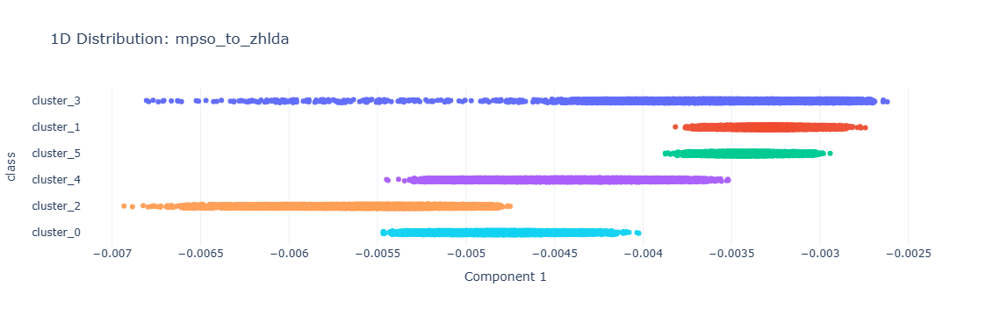

----------------------------------------------------------------------------------------------------
2     | mpso_to_gdhlda            | 10.8640      | 1
      📉 Selection Stats: 30 numeric features available for mapping.
      ↳ LD1 (100.0%): RES38_83 (-0.99), RES38_75 (-0.98), RES38_80 (-0.98), RES37_75 (-0.98), RES38_82 (-0.98)


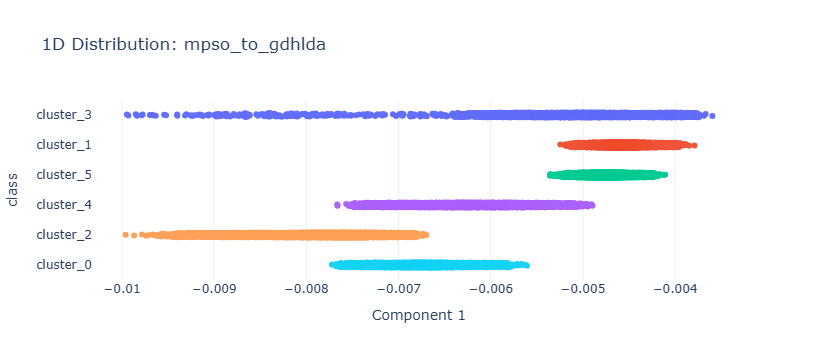

----------------------------------------------------------------------------------------------------
3     | mpso_to_mhlda             | 10.8492      | 1
      📉 Selection Stats: 30 numeric features available for mapping.
      ↳ LD1 (100.0%): RES38_83 (-0.99), RES38_75 (-0.98), RES38_80 (-0.98), RES37_75 (-0.98), RES38_82 (-0.98)


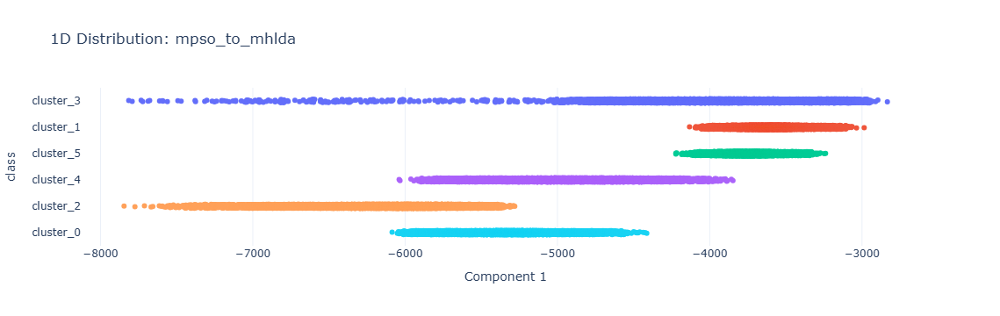

----------------------------------------------------------------------------------------------------
4     | bpso_to_mhlda             | 10.8411      | 1
      📉 Selection Stats: 11 numeric features available for mapping.
      ↳ LD1 (100.0%): RES35_75 (0.98), RES38_83 (0.98), RES38_73 (0.98), RES38_86 (0.97), RES38_141 (0.97)
----------------------------------------------------------------------------------------------------
5     | mpso_to_flda              | 10.8378      | 1
      📉 Selection Stats: 30 numeric features available for mapping.
      ↳ LD1 (100.0%): RES38_83 (-0.99), RES38_75 (-0.98), RES38_80 (-0.98), RES37_75 (-0.98), RES38_82 (-0.98)
----------------------------------------------------------------------------------------------------
6     | bpso_to_flda              | 10.8377      | 1
      📉 Selection Stats: 11 numeric features available for mapping.
      ↳ LD1 (100.0%): RES38_83 (-0.99), RES38_86 (-0.98), RES35_75 (-0.98), RES38_73 (-0.97), RES38_141 (-0.97)
----

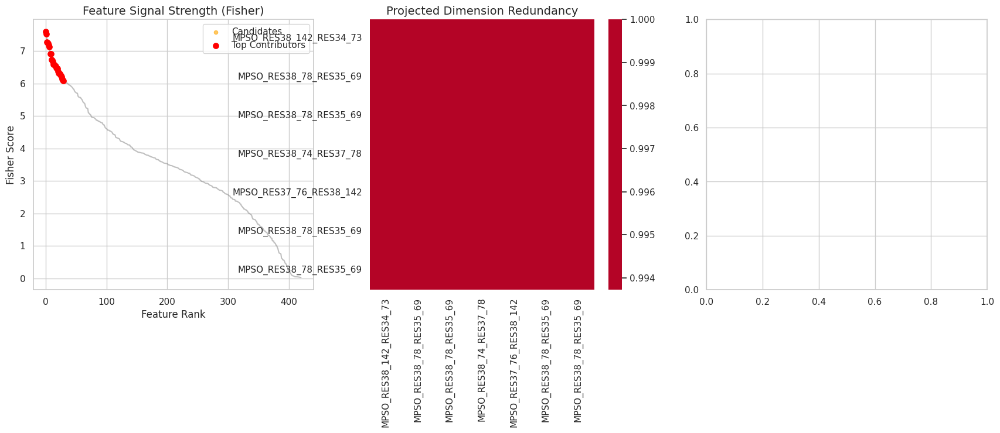

In [4]:
print("🚀 Starting Interactive Pipeline Runner")
print("💡 Variance runs first, then feature selection, then dimensionality reduction")
print("⚙️  You'll set parameters for each phase")

# Use the pipeline runner
results, base_df = run_interactive_pipeline(data_factory, configs)

In [6]:
import pickle
from pathlib import Path

export_dir = Path("results/cmpcam_gmm")
export_dir.mkdir(parents=True, exist_ok=True)

try:
    with open(export_dir / "pipeline_results.pkl", "wb") as f:
        # Protocol 5 is faster and handles larger objects better
        pickle.dump(results, f, protocol=pickle.HIGHEST_PROTOCOL)

    with open(export_dir / "base_df_metadata.pkl", "wb") as f:
        pickle.dump(base_df, f, protocol=pickle.HIGHEST_PROTOCOL)
        
    print(f"✅ State preserved in {export_dir}/")
except Exception as e:
    print(f"❌ Save failed: {e}")

✅ State preserved in results/cmpcam_gmm/
